In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
motor=pd.read_csv("temperature_data.csv")
motor.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


# EDA

In [4]:
motor.shape

(998070, 13)

In [5]:
motor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


In [6]:
motor.describe().T

,count,mean,std,min,25%,50%,75%,max
ambient,998070.0,-0.003905,0.993127,-8.573954,-0.599385,0.266157,0.686675,2.967117
coolant,998070.0,0.004723,1.002423,-1.429349,-1.037925,-0.177187,0.650709,2.649032
u_d,998070.0,0.004780,0.997878,-1.655373,-0.826359,0.267542,0.358491,2.274734
u_q,998070.0,-0.005690,1.002330,-1.861463,-0.927390,-0.099818,0.852625,1.793498
motor_speed,998070.0,-0.006336,1.001229,-1.371529,-0.951892,-0.140246,0.853584,2.024164
torque,998070.0,-0.003333,0.997907,-3.345953,-0.266917,-0.187246,0.547171,3.016971
i_d,998070.0,0.006043,0.998994,-3.245874,-0.756296,0.213935,1.013975,1.060937
i_q,998070.0,-0.003194,0.997912,-3.341639,-0.257269,-0.190076,0.499260,2.914185
pm,998070.0,-0.004396,0.995686,-2.631991,-0.672308,0.094367,0.680691,2.917456
stator_yoke,998070.0,0.000609,1.001049,-1.834688,-0.747265,-0.057226,0.697344,2.449158


In [7]:
#checking correlation with respect to torque
motor.corr()['torque']

ambient          -0.262264
coolant          -0.189617
u_d              -0.821325
u_q              -0.037262
motor_speed       0.024517
torque            1.000000
i_d              -0.239059
i_q               0.996560
pm               -0.072905
stator_yoke      -0.092207
stator_tooth     -0.011055
stator_winding    0.080981
profile_id       -0.257446
Name: torque, dtype: float64

In [8]:
#checking correlation with respect to motor_speed
motor.corr()['motor_speed']

ambient           0.078283
coolant          -0.033332
u_d              -0.233828
u_q               0.716897
motor_speed       1.000000
torque            0.024517
i_d              -0.722914
i_q               0.006323
pm                0.332419
stator_yoke       0.182564
stator_tooth      0.333909
stator_winding    0.393154
profile_id       -0.166225
Name: motor_speed, dtype: float64

In [9]:
corr_motor_speed=motor.corr()['motor_speed']

In [10]:
y=corr_motor_speed.to_list()
x=motor.columns

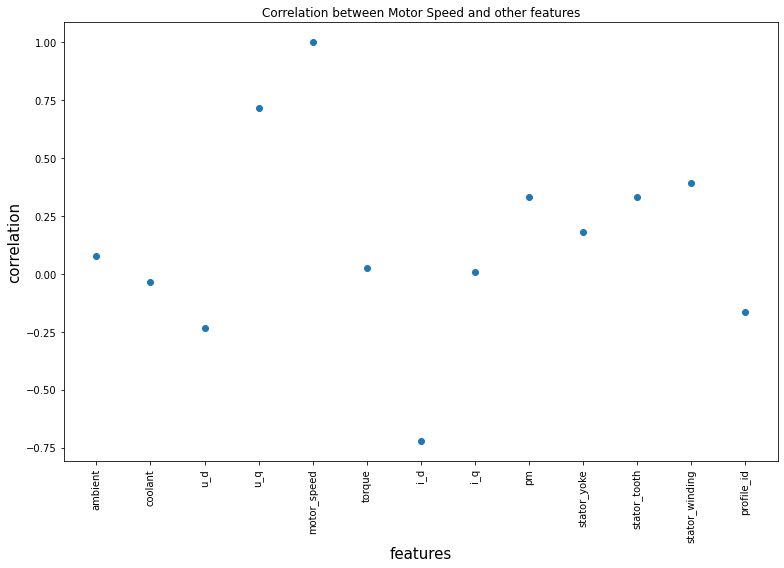

In [11]:
plt.figure(figsize=[11,8])
plt.scatter(x,y,)
plt.title("Correlation between Motor Speed and other features")
plt.xlabel("features", size=15)
plt.ylabel("correlation", size=15)
plt.xticks(x, [str(i) for i in x], rotation=90)

#set parameters for tick labels
plt.tick_params(axis='x', which='major', labelsize=10)

plt.tight_layout()
plt.show()

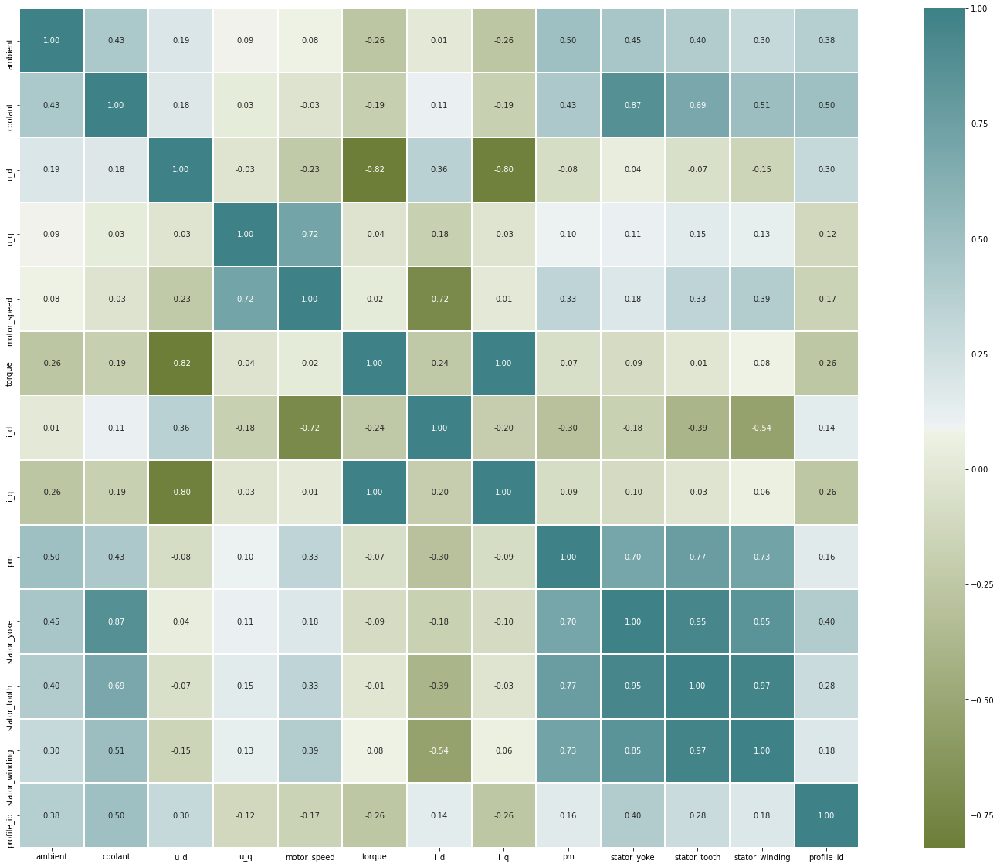

In [11]:
#correlation map
cax=plt.subplots(figsize=(30,20))
corr=motor.corr()
sns.heatmap(corr, annot=True , linewidths=1, fmt='.2f', 
            mask= np.zeros_like(corr,dtype=np.bool),            
            cmap=sns.diverging_palette(100,200,as_cmap=True),
            square=True)

plt.show()

<AxesSubplot:>

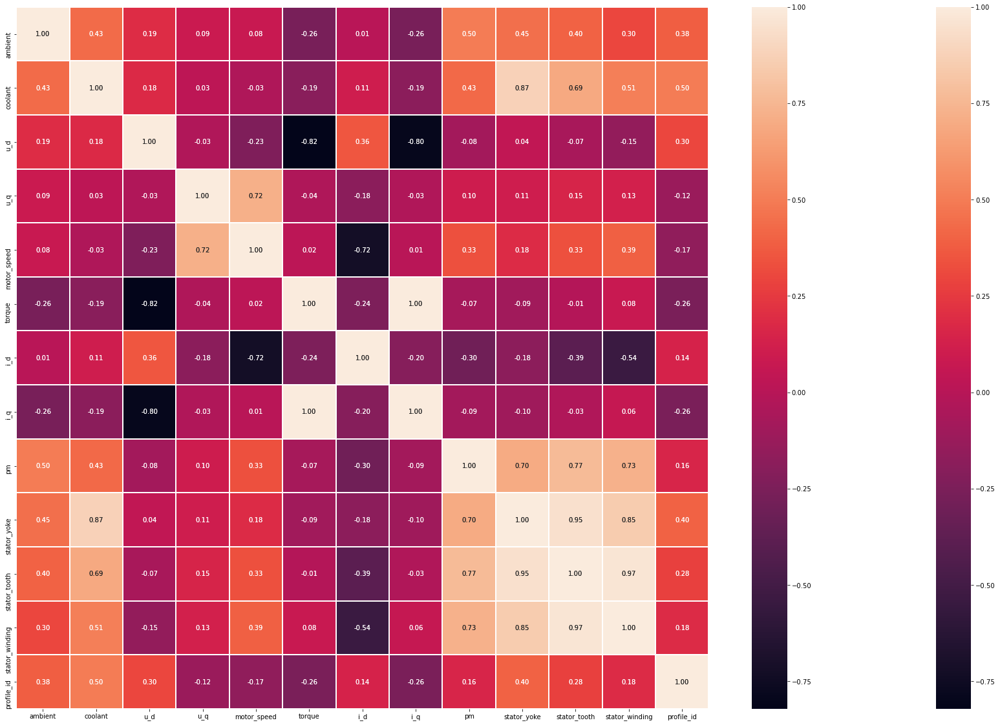

In [12]:
ax=plt.subplots(figsize=(30,20))
#sns.heatmap(motor.corr())
sns.heatmap(motor.corr(), annot=True, linewidths=1, fmt='.2f', mask= np.zeros_like(motor.corr(),dtype=np.bool))
sns.heatmap(motor.corr(), annot=True, linewidths=1, fmt='.2f', mask= np.zeros_like(motor.corr(),dtype=np.bool))
            

In [13]:
#checking for missing data 
motor.isnull().sum()

ambient           0
coolant           0
u_d               0
u_q               0
motor_speed       0
torque            0
i_d               0
i_q               0
pm                0
stator_yoke       0
stator_tooth      0
stator_winding    0
profile_id        0
dtype: int64

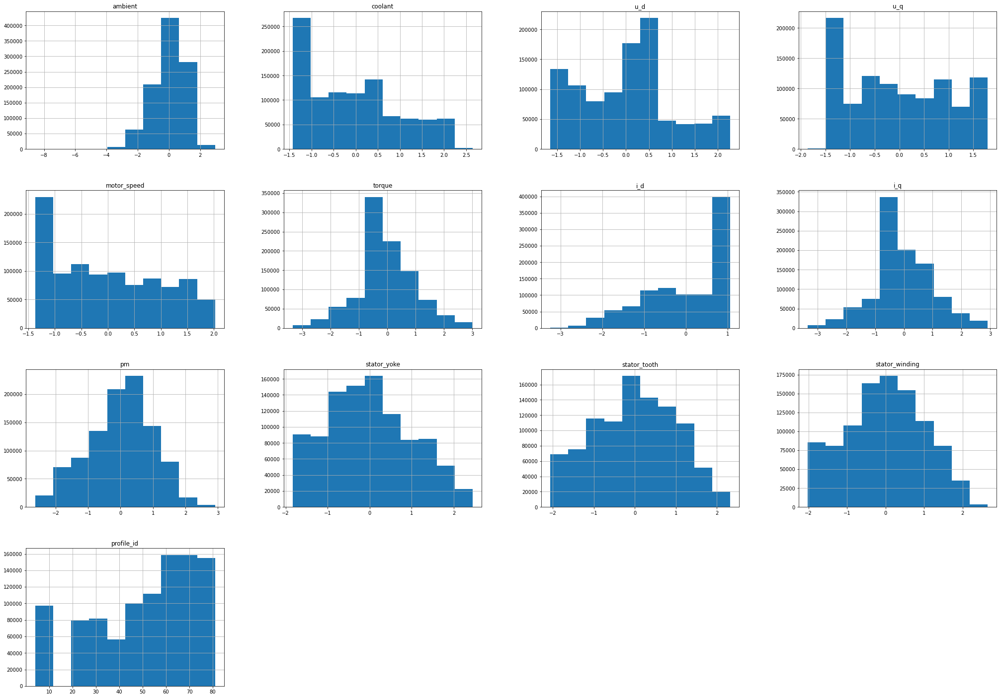

In [14]:
motor.hist(figsize = (35,25))
plt.show()

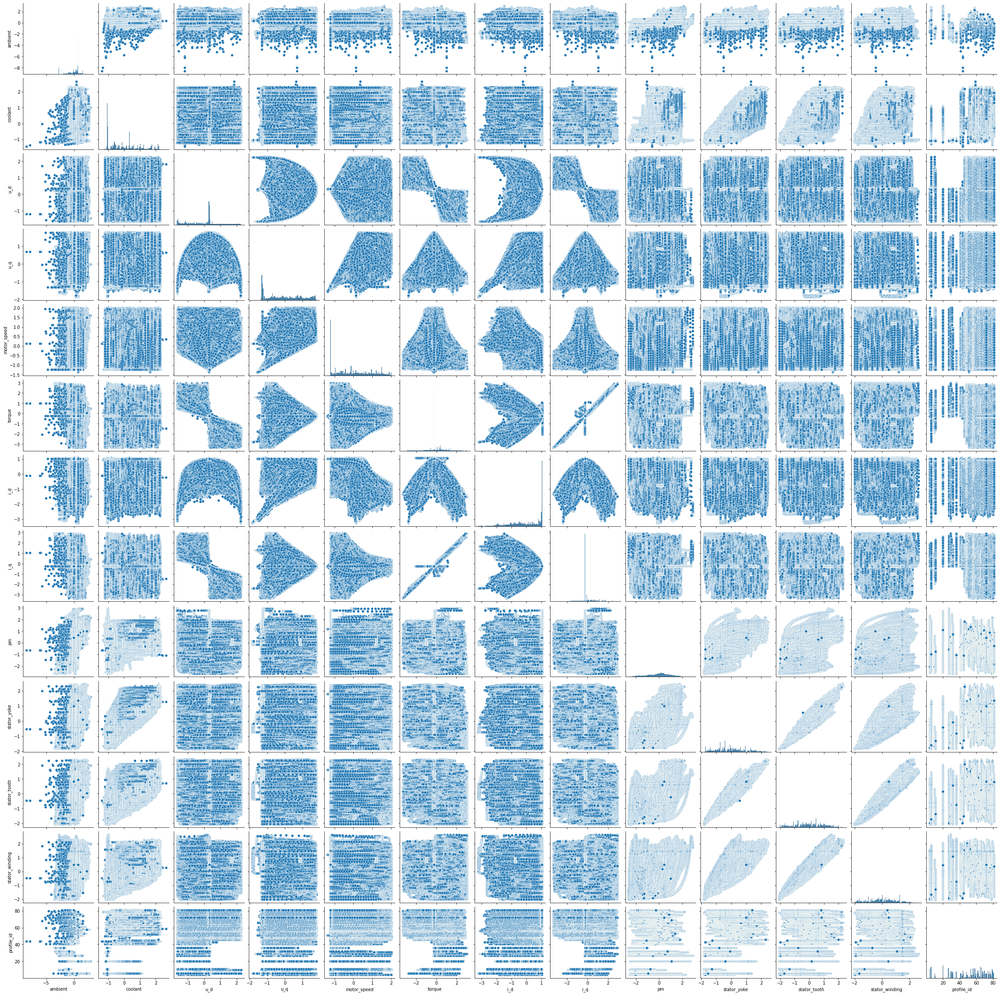

In [15]:
sns.pairplot(motor)

In [16]:
#checking for duplicates in the dataset
motor1=motor.drop_duplicates(keep='first')

In [17]:
motor1.shape

(998070, 13)

There is no duplicate values present in the dataset

Text(0.5, 1.0, 'count of profile_id')

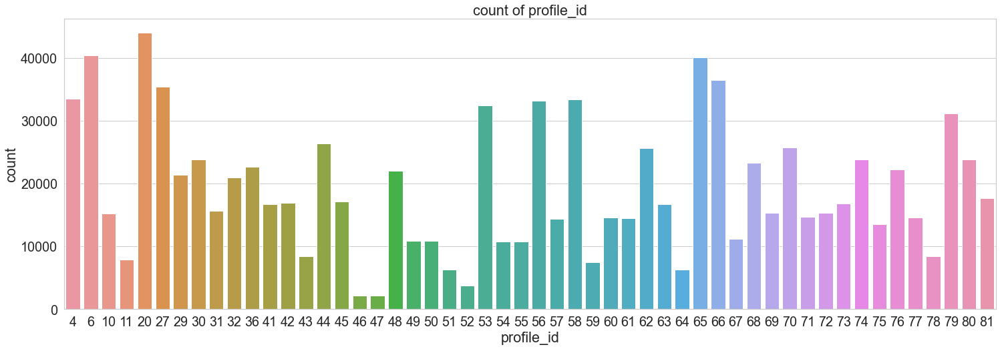

In [18]:
sns.set(style="whitegrid", font_scale=1.8)
plt.subplots(figsize = (25,8))
sns.countplot('profile_id',data=motor).set_title('count of profile_id')

Text(0.5, 1.0, 'Count of profile_id')

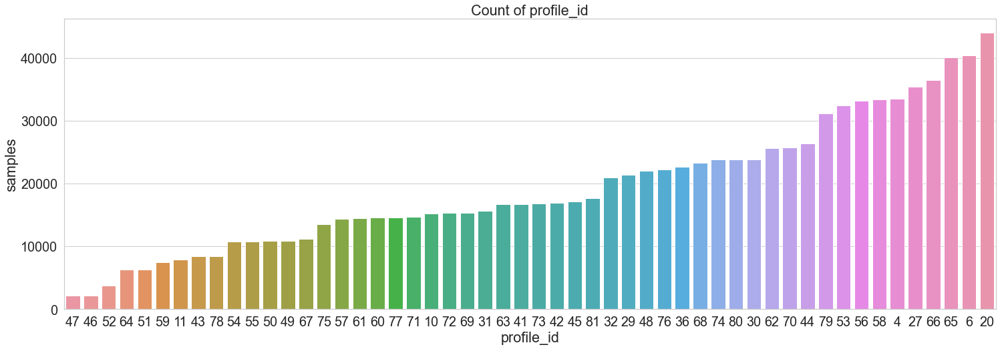

In [19]:
#barplot for profile_id 
sns.set(style="whitegrid", font_scale=1.8)
plt.subplots(figsize = (25,8))
grpd = motor.groupby(['profile_id'])
_df = grpd.size().sort_values().rename('samples').reset_index()
ordered_ids = _df.profile_id.values.tolist()
sns.barplot(y='samples', x='profile_id', data=_df, order=ordered_ids).set_title('Count of profile_id')

<AxesSubplot:xlabel='profile_id', ylabel='motor_speed'>

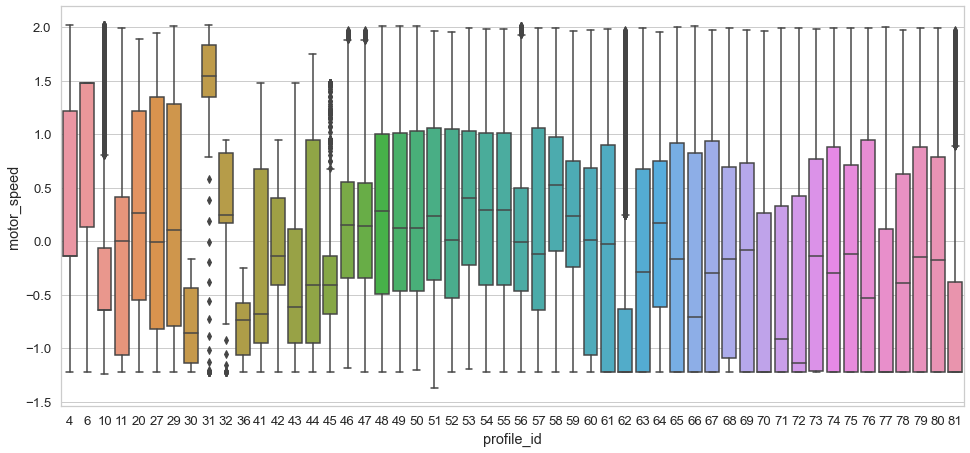

In [20]:
sns.set(style="whitegrid", font_scale=1.2)
plt.subplots(figsize = (55,25))
plt.subplot(3,3,1)
sns.boxplot(x='profile_id', y='motor_speed', data=motor)

In [12]:
x=motor.drop("motor_speed",axis=1)
y=motor.iloc[:,5:6]
x.head()

,ambient,coolant,u_d,u_q,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [13]:
y.head()

,torque
0,-0.250182
1,-0.249133
2,-0.249431
3,-0.248636
4,-0.248701


In [14]:
from sklearn.model_selection import train_test_split
train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=0.3,random_state=0)

In [15]:
#shape of train and test
print(train_x.shape, train_y.shape)
print(test_x.shape, test_y.shape)

(698649, 12) (698649, 1)
(299421, 12) (299421, 1)


In [25]:
!pip install sweetviz
!pip install pandas_profiling
#pip install markupsafe
import sweetviz as sv 
sweet_report = sv.analyze(motor)
sweet_report.show_html('temperature_data.html')  

                                             |                                             | [  0%]   00:00 ->…

Report temperature_data.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [26]:
import numpy as np
np.seterr(all='warn')
A = np.array([10])
a=A[-1]
a**a
import pandas_profiling as pp
EDA_report= pp.ProfileReport(motor)
EDA_report.to_file(output_file='report.html') 
EDA_report   

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
motor.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [17]:
motor=motor.drop("profile_id",axis=1)

In [18]:
motor.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145


In [19]:
motor.corr()['ambient']
#ambient is NOT so highly corelated between other features also not corelated with the target variable. 

ambient           1.000000
coolant           0.434435
u_d               0.194754
u_q               0.087430
motor_speed       0.078283
torque           -0.262264
i_d               0.005605
i_q              -0.260562
pm                0.501496
stator_yoke       0.451616
stator_tooth      0.396742
stator_winding    0.301883
Name: ambient, dtype: float64

In [20]:
motor.corr()['coolant']
#coolant is highly corelated with stator_yoke and stator_tooth and not corelated with target variable

ambient           0.434435
coolant           1.000000
u_d               0.178708
u_q               0.027851
motor_speed      -0.033332
torque           -0.189617
i_d               0.108489
i_q              -0.186060
pm                0.430548
stator_yoke       0.874037
stator_tooth      0.689003
stator_winding    0.509298
Name: coolant, dtype: float64

In [21]:
motor.corr()['u_q']
#u_q is NOT corelated with other features but HIGHLY corelated with target variable

ambient           0.087430
coolant           0.027851
u_d              -0.027472
u_q               1.000000
motor_speed       0.716897
torque           -0.037262
i_d              -0.181855
i_q              -0.026348
pm                0.101236
stator_yoke       0.106186
stator_tooth      0.149017
stator_winding    0.125445
Name: u_q, dtype: float64

In [22]:
motor.corr()['u_d']
#u_d is highly corelated with Torque and I_q and not correlated with the target variable.

ambient           0.194754
coolant           0.178708
u_d               1.000000
u_q              -0.027472
motor_speed      -0.233828
torque           -0.821325
i_d               0.358517
i_q              -0.796586
pm               -0.082564
stator_yoke       0.041428
stator_tooth     -0.066256
stator_winding   -0.150714
Name: u_d, dtype: float64

In [23]:
motor.corr()['torque']
#torque is highly corelated with u_d and i_q and not corelated with target variable.

ambient          -0.262264
coolant          -0.189617
u_d              -0.821325
u_q              -0.037262
motor_speed       0.024517
torque            1.000000
i_d              -0.239059
i_q               0.996560
pm               -0.072905
stator_yoke      -0.092207
stator_tooth     -0.011055
stator_winding    0.080981
Name: torque, dtype: float64

In [24]:
motor.corr()['i_d']
#i_d is little bit corelated with stator_winding and HIGHLY corelated with target variable.

ambient           0.005605
coolant           0.108489
u_d               0.358517
u_q              -0.181855
motor_speed      -0.722914
torque           -0.239059
i_d               1.000000
i_q              -0.204230
pm               -0.299227
stator_yoke      -0.179903
stator_tooth     -0.387712
stator_winding   -0.539924
Name: i_d, dtype: float64

In [25]:
motor.corr()['i_q']
#i_q is highly corelated with u_d and torque and not at all corelated with target variable.

ambient          -0.260562
coolant          -0.186060
u_d              -0.796586
u_q              -0.026348
motor_speed       0.006323
torque            0.996560
i_d              -0.204230
i_q               1.000000
pm               -0.086486
stator_yoke      -0.098753
stator_tooth     -0.025191
stator_winding    0.060949
Name: i_q, dtype: float64

In [26]:
motor.corr()['pm']
#pm is corelated with ambient, stator_yoke, stator_tooth, stator_winding and nor corelated with target variable

ambient           0.501496
coolant           0.430548
u_d              -0.082564
u_q               0.101236
motor_speed       0.332419
torque           -0.072905
i_d              -0.299227
i_q              -0.086486
pm                1.000000
stator_yoke       0.695014
stator_tooth      0.768352
stator_winding    0.729561
Name: pm, dtype: float64

In [27]:
motor.corr()['stator_yoke']
#stator_yoke is highly corelated with coolant, pm, stator_tooth, stator_winding and not corelated with the target variable.

ambient           0.451616
coolant           0.874037
u_d               0.041428
u_q               0.106186
motor_speed       0.182564
torque           -0.092207
i_d              -0.179903
i_q              -0.098753
pm                0.695014
stator_yoke       1.000000
stator_tooth      0.949898
stator_winding    0.845144
Name: stator_yoke, dtype: float64

In [28]:
motor.corr()['stator_tooth']
#stator_tooth is highly corelated with pm, coolant, stator_yoke, stator_winding and not corelated with target variable.

ambient           0.396742
coolant           0.689003
u_d              -0.066256
u_q               0.149017
motor_speed       0.333909
torque           -0.011055
i_d              -0.387712
i_q              -0.025191
pm                0.768352
stator_yoke       0.949898
stator_tooth      1.000000
stator_winding    0.965633
Name: stator_tooth, dtype: float64

In [29]:
motor.corr()['stator_winding']
#stator_winding is highly corelated with pm, stator_yoke , stator_tooth and not so corelated with target variable

ambient           0.301883
coolant           0.509298
u_d              -0.150714
u_q               0.125445
motor_speed       0.393154
torque            0.080981
i_d              -0.539924
i_q               0.060949
pm                0.729561
stator_yoke       0.845144
stator_tooth      0.965633
stator_winding    1.000000
Name: stator_winding, dtype: float64

In [30]:
motor.corr()['motor_speed']

ambient           0.078283
coolant          -0.033332
u_d              -0.233828
u_q               0.716897
motor_speed       1.000000
torque            0.024517
i_d              -0.722914
i_q               0.006323
pm                0.332419
stator_yoke       0.182564
stator_tooth      0.333909
stator_winding    0.393154
Name: motor_speed, dtype: float64

In [31]:
from statsmodels.graphics.regressionplots import influence_plot
import statsmodels.formula.api as smf

In [48]:
model=smf.ols('motor_speed~ambient+coolant+u_d+u_q+torque+i_q+i_d+pm+stator_yoke+stator_tooth+stator_winding',data=motor).fit()

In [49]:
model.rsquared
#with out feature reduction we have got 92 percent acurracy which is really good.

0.9280781257588527

In [50]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            motor_speed   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.928
Method:                 Least Squares   F-statistic:                 1.171e+06
Date:                Tue, 24 Jan 2023   Prob (F-statistic):               0.00
Time:                        14:33:49   Log-Likelihood:            -1.0388e+05
No. Observations:              998070   AIC:                         2.078e+05
Df Residuals:                  998058   BIC:                         2.079e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.0006      0.000      2.399      0.016       0.000       0.001
ambient           -0.0504      0.000   -147.501      0.000      -0.051      -0.050
coolant            0.4102      0.002    244.356      0.000       0.407       0.413
u_d               -0.1661      0.001   -285.502      0.000      -0.167      -0.165
u_q                0.5395      0.000   1646.147      0.000       0.539       0.540
torque            -0.3442      0.004    -79.190      0.000      -0.353      -0.336
i_q                0.1381      0.004     33.779      0.000       0.130       0.146
i_d               -0.6577      0.000  -1417.144      0.000      -0.659      -0.657
pm                 0.1063      0.001    191.352      0.000       0.105       0.107
stator_yoke       -1.6290      0.005   -315.783      0.000      -1.639      -1.619
stator_tooth       2.3192      0.007    340.321      0.000       2.306       2.333
stator_winding    -1.1684      0.003   -346.265      0.000      -1.175      -1.162
==============================================================================
Omnibus:                    53747.933   Durbin-Watson:                   0.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           205507.215
Skew:                          -0.118   Prob(JB):                         0.00
Kurtosis:                       5.210   Cond. No.                         69.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [60]:
#building the model by excluding on of the feature which are dependent to each other
model2=smf.ols('motor_speed~u_q+i_d+stator_winding+pm+stator_tooth+torque',data=motor).fit()

In [61]:
model2.rsquared

0.907150533976278

In [38]:
motor_cpy=motor.copy()

In [39]:
motor_cpy['u_q_sqrd']=motor_cpy['u_q']**2
motor_cpy['i_d_sqrd']=motor_cpy['i_q']**2
motor_cpy['stator_tooth_sqrd']=motor_cpy['stator_tooth']**2
motor_cpy['stator_winding_sqrd']=motor_cpy['stator_winding']**2

In [42]:
motor_cpy.head()
motor_cpy=motor_cpy.drop(['stator_tooth_sqrd','stator_winding_sqrd'],axis=1)

In [35]:
model3=smf.ols('motor_speed~ambient+coolant+u_d+u_q+torque+i_q+i_d+pm+stator_yoke+stator_tooth+stator_winding+u_q_sqrd+i_d_sqrd',data=motor_cpy).fit()

In [100]:
model3.rsquared

0.972634265034531

In [101]:
model3.summary()
#after feature transformation the Rsquared value as exceptionaly increased.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            motor_speed   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                 2.729e+06
Date:                Tue, 24 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:11:17   Log-Likelihood:             3.7833e+05
No. Observations:              998070   AIC:                        -7.566e+05
Df Residuals:                  998056   BIC:                        -7.565e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1799      0.000    528.095      0.000       0.179       0.181
ambient           -0.0176      0.000    -82.705      0.000      -0.018      -0.017
coolant            0.2160      0.001    206.347      0.000       0.214       0.218
u_d               -0.0563      0.000   -151.285      0.000      -0.057      -0.056
u_q                0.5191      0.000   2468.124      0.000       0.519       0.519
torque            -0.5399      0.003   -198.435      0.000      -0.545      -0.535
i_q                0.3426      0.003    133.776      0.000       0.338       0.348
i_d               -0.7207      0.000  -2449.844      0.000      -0.721      -0.720
pm                 0.0551      0.000    159.484      0.000       0.054       0.056
stator_yoke       -0.5742      0.003   -174.520      0.000      -0.581      -0.568
stator_tooth       0.3676      0.004     81.956      0.000       0.359       0.376
stator_winding     0.0254      0.002     11.083      0.000       0.021       0.030
u_q_sqrd          -0.0007      0.000     -3.297      0.001      -0.001      -0.000
i_d_sqrd          -0.1790      0.000  -1231.898      0.000      -0.179      -0.179
==============================================================================
Omnibus:                   146495.131   Durbin-Watson:                   0.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1334452.492
Skew:                           0.424   Prob(JB):                         0.00
Kurtosis:                       8.601   Cond. No.                         77.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [43]:
X=motor_cpy.drop(['motor_speed'],axis=1)

In [44]:
Y=motor_cpy.iloc[:,4]

In [45]:
Y.head()

0   -1.222428
1   -1.222429
2   -1.222428
3   -1.222430
4   -1.222429
Name: motor_speed, dtype: float64

In [46]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3,random_state=10)

In [47]:
X.head()

,ambient,coolant,u_d,u_q,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,u_q_sqrd,i_d_sqrd
0,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,1.684434,0.060447
1,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,1.683990,0.060434
2,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,1.694740,0.060426
3,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,1.694819,0.060987
4,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,1.698117,0.060816


In [85]:
#Scaling the data

In [48]:
from sklearn.preprocessing import StandardScaler 
from sklearn.compose import ColumnTransformer 

t=[('num',StandardScaler(),['ambient', 'coolant', 'u_d', 'u_q','torque', 'i_d', 'i_q', 'pm', 'stator_yoke','stator_tooth','stator_winding','u_q_sqrd','i_d_sqrd'])]
transformer=ColumnTransformer(transformers=t,remainder='passthrough') 
transformer.fit(X_train)  

# transform training data.
X_train = transformer.transform(X_train) 

# transform the test data.
X_test = transformer.transform(X_test) 


In [49]:
from sklearn.linear_model import LinearRegression, ElasticNet 
from sklearn.metrics import mean_absolute_error , mean_squared_error, r2_score 
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor , AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor


In [57]:
#implementing DecisionTreeRegressor
DTR=DecisionTreeRegressor()
DTR.fit(X_train,Y_train)

#predicting using the test set
y_pred_DTR = DTR.predict(X_test)
MAE1=mean_absolute_error(Y_test,y_pred_DTR)
MSE1=mean_squared_error(Y_test,y_pred_DTR)
R2S1=r2_score(Y_test,y_pred_DTR)


In [58]:
R2S1

0.9996446336649573

In [78]:
#implementing RandomForestRegressor
RFR=RandomForestRegressor()
RFR.fit(X_train,Y_train)

#predicting using the test set
y_pred_RFR = RFR.predict(X_test)
MAE2=mean_absolute_error(Y_test,y_pred_RFR)
MSE2=mean_squared_error(Y_test,y_pred_RFR)
R2S2=r2_score(Y_test,y_pred_RFR)


In [79]:
R2S2

0.9998207224107487

In [60]:
#implementing ExtraTreeRegressor
ETR=ExtraTreeRegressor()
ETR.fit(X_train,Y_train)

#predicting using the test set
y_pred_ETR = ETR.predict(X_test)
MAE3=mean_absolute_error(Y_test,y_pred_ETR)
MSE3=mean_squared_error(Y_test,y_pred_ETR)
R2S3=r2_score(Y_test,y_pred_ETR)


In [61]:
R2S3

0.9996239718705733

In [64]:
#implementing BaggingRegressor
BAG=BaggingRegressor()
BAG.fit(X_train,Y_train)

#predicting using the test set
y_pred_BAG = BAG.predict(X_test)
MAE4=mean_absolute_error(Y_test,y_pred_BAG)
MSE4=mean_squared_error(Y_test,y_pred_BAG)
R2S4=r2_score(Y_test,y_pred_BAG)


In [65]:
R2S4

0.9997907014154889

In [66]:
#implementing AdaBoostRegressor
ADA=AdaBoostRegressor()
ADA.fit(X_train,Y_train)

#predicting using the test set
y_pred_ADA = ADA.predict(X_test)
MAE5=mean_absolute_error(Y_test,y_pred_ADA)
MSE5=mean_squared_error(Y_test,y_pred_ADA)
R2S5=r2_score(Y_test,y_pred_ADA)


In [67]:
R2S5

0.9363372485343239

In [70]:
#implementing GradientBoostRegressor
GBR=GradientBoostingRegressor()
GBR.fit(X_train,Y_train)

#predicting using the test set
y_pred_GBR = GBR.predict(X_test)
MAE6=mean_absolute_error(Y_test,y_pred_GBR)
MSE6=mean_squared_error(Y_test,y_pred_GBR)
R2S6=r2_score(Y_test,y_pred_GBR)


In [71]:
R2S6

0.9959559089636407

In [73]:
#implementing LinearRegressor
LR=LinearRegression()
LR.fit(X_train,Y_train)

#predicting using the test set
y_pred_LR = LR.predict(X_test)
MAE7=mean_absolute_error(Y_test,y_pred_LR)
MSE7=mean_squared_error(Y_test,y_pred_LR)
R2S7=r2_score(Y_test,y_pred_LR)


In [74]:
R2S7

0.972750789186067

In [76]:
#implementing Elastic net
ELN=ElasticNet()
ELN.fit(X_train,Y_train)

#predicting using the test set
y_pred_ELN = ELN.predict(X_test)
MAE8=mean_absolute_error(Y_test,y_pred_ELN)
MSE8=mean_squared_error(Y_test,y_pred_ELN)
R2S8=r2_score(Y_test,y_pred_ELN)


In [77]:
R2S8

0.3368865246868258

In [83]:
#Result table
table={'Mean absolute error':[MAE1,MAE2,MAE3,MAE4,MAE5,MAE6,MAE7,MAE8],'Mean Square error':[MSE1,MSE2,
                                                MSE3,MSE4,MSE5,MSE6,MSE7,MSE8],'R_2 Score':[R2S1,R2S2,R2S3,
                                                                            R2S4,R2S5,R2S6,R2S7,R2S8]}
Index=['DecisionTreeRegressor','RandomForestRegressor','ExtraTreeRegressor','BaggingRegressor','AdaBoostRegressor',
         'GradientBoostRegressor','LinearRegressor','Elastic net']
result=pd.DataFrame(table,index=Index)

In [84]:
result

,Mean absolute error,Mean Square error,R_2 Score
DecisionTreeRegressor,0.006361,0.000356,0.999645
RandomForestRegressor,0.003721,0.000180,0.999821
ExtraTreeRegressor,0.006729,0.000377,0.999624
BaggingRegressor,0.004250,0.000210,0.999791
AdaBoostRegressor,0.214008,0.063829,0.936337
GradientBoostRegressor,0.040745,0.004055,0.995956
LinearRegressor,0.113622,0.027320,0.972751
Elastic net,0.703447,0.664844,0.336887


# RANDOM FOREST IS THE BEST FITTING MODEL WITH R2 SCORE 99.98%